# 1. Import Libraries

In [1]:
import tensorflow as tf
import os
import json
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import random
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
import collections
import time
from collections import Counter
import string
from sklearn.utils import shuffle
from pickle import dump
from pickle import load
import pathlib
import re
import datetime

# model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, BatchNormalization
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import add
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

In [2]:
print(tf.__version__)

2.8.0


# 2. Setting Directories

In [3]:
data_dir = os.path.abspath('.') + '/data'
image_dir = data_dir + '/images/'
annotation_dir = data_dir + '/annotations/'
annotation_path = {'train': 'train.json',
                      'val': 'val.json'}
image_path = {'train': 'train/',
              'val': 'val/'}

checkpoint_path =  os.path.abspath('.') + '/checkpoints/train'

In [4]:
os.makedirs(checkpoint_path, exist_ok=True)

# 3. Getting the Dataset

In [5]:
# Downloading Annotations
if not os.path.exists(annotation_dir):

    annotation_zip = tf.keras.utils.get_file('annotations.zip',
                                          cache_subdir=os.path.abspath('.') + '/data',
                                          origin = 'https://ivc.ischool.utexas.edu/VizWiz_final/caption/annotations.zip',
                                          extract = True)

    os.remove(annotation_zip)

# Downloading Images
image_folders = ['/data/images/train', '/data/images/val/']
names_and_endings = ['train.zip','val.zip']
altogether = zip(image_folders, names_and_endings)

for image_folder, name_and_ending in altogether:
    if not os.path.exists(os.path.abspath('.') + image_folder):
        image_zip = tf.keras.utils.get_file(name_and_ending,
        cache_subdir = os.path.abspath('.') + '/data/images',
        origin = 'https://ivc.ischool.utexas.edu/VizWiz_final/images/' + name_and_ending,
        extract = True)
        os.remove(image_zip)

# 4. Configurations

In [6]:
TRAIN_MODE = 'Sub'
TRAIN_MODE_SIZE = 6000
IMAGE_SIZE = 299
BATCH_SIZE = 32
BUFFER_SIZE = 1000
EMBEDDING_DIM = 256
UNITS = 512
EPOCHS = 10
TOP_K_WORDS = 5000

# 5. Data Processing

### Group all captions and images

In [7]:
ls_captions = []
ls_image_path = []

with open(annotation_dir + annotation_path["train"], 'r') as f:
    caption_data = json.load(f)

id_to_filename = {image['id']: image['file_name'] for image in caption_data["images"]}

# Group all captions together having same image ID
image_path_to_caption = collections.defaultdict(list)

for annotation in caption_data['annotations']:
  # remove captions with TRUE value in is_precanned as its caption would be invalid
  if (annotation["is_precanned"] == False):
    image_id = annotation["image_id"]
    caption = annotation['caption']
    image_path = image_dir + "train/" + id_to_filename[image_id]
    image_path_to_caption[image_path].append(caption)
    ls_captions.append(caption)
    ls_image_path.append(image_path)

# save into dataframe
data = pd.DataFrame()
data["caption"] = ls_captions
data["filename"] = ls_image_path

In [8]:
data.shape

(101996, 2)

In [9]:
data.head()

,caption,filename
0,ITS IS A BASIL LEAVES CONTAINER ITS CONTAINS T...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
1,A green and white plastic condiment bottle con...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
2,A bottle of spices in a plastic container layi...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
3,some basil leaves in a container on a counter,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
4,A can of Coca Cola on a counter is shown for w...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...


In [10]:
def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

In [11]:
unique_filenames = utility_counter(data)

The number of unique file names : 22900
We can see that all the keys are having values count = 5
Counter({'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000001.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000002.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000003.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000004.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000006.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000007.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000008.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000009.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyter_workspace\\TMP/data/images/train/VizWiz_train_00000010.jpg': 5, 'E:\\WorkSpace\\Coding\\Jupyte

In [12]:
#Function to plot the images and its description
# https://fairyonice.github.io/Develop_an_image_captioning_deep_learning_model_using_Flickr_8K_data.html
def image_desc_plotter(data):
  npic = 5
  npix = 299
  target_size = (npix,npix,3)

  count = 1
  fig = plt.figure(figsize=(10,20))
  for jpgfnm in unique_filenames[50:55]:
      filename = jpgfnm
      captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
      image_load = load_img(filename, target_size=target_size)
      
      ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
      ax.imshow(image_load)
      count += 1
      
      ax = fig.add_subplot(npic,2,count)
      plt.axis('off')
      ax.plot()
      ax.set_xlim(0,1)
      ax.set_ylim(0,len(captions))
      for i, caption in enumerate(captions):
          ax.text(0,i,caption,fontsize=20)
      count += 1
  plt.show()

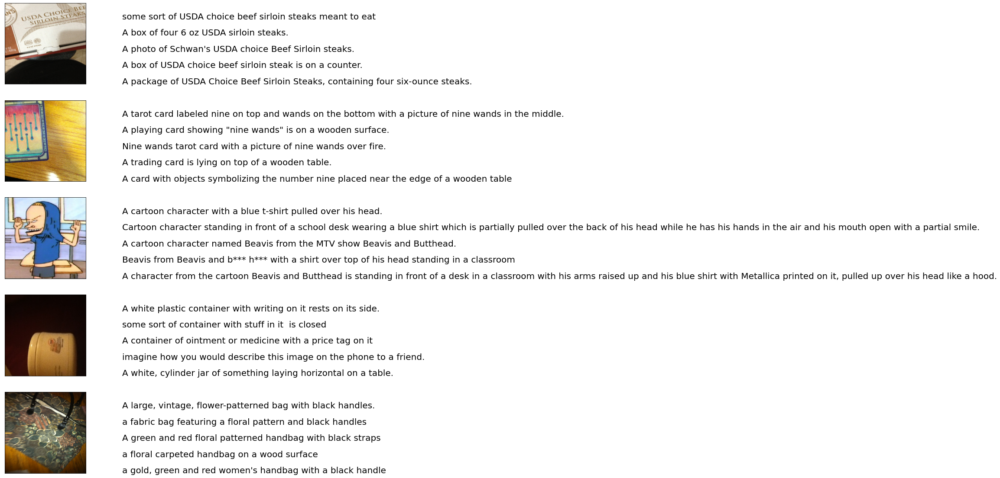

In [13]:
image_desc_plotter(data)

### Create subset to use as training set

In [14]:
def create_subset(image_path_to_caption, mode):
  image_paths = list(image_path_to_caption.keys())
  if mode == "Full":
    train_image_paths = image_paths
  else:
    random.shuffle(image_paths)
    train_image_paths = image_paths[:TRAIN_MODE_SIZE]
    
  return train_image_paths

In [15]:
caption_vector = []
img_vector = []
train_image_paths = create_subset(image_path_to_caption, TRAIN_MODE)

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  caption_vector.extend(caption_list)
  img_vector.extend([image_path]*len(caption_list))

In [16]:
data = pd.DataFrame()
data["caption"] = caption_vector
data["image"] = img_vector

In [17]:
data.shape

(26784, 2)

# 6. Caption and Image Preprocessing

### Create vocabulary and analyse word count


In [18]:
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

In [19]:
clean_vocabulary = create_vocabulary(data)

Vocabulary Size : 17726


In [20]:
def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

In [21]:
dfwordcount = df_word_count(data,clean_vocabulary)

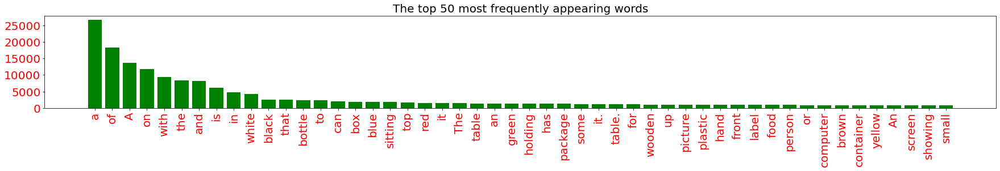

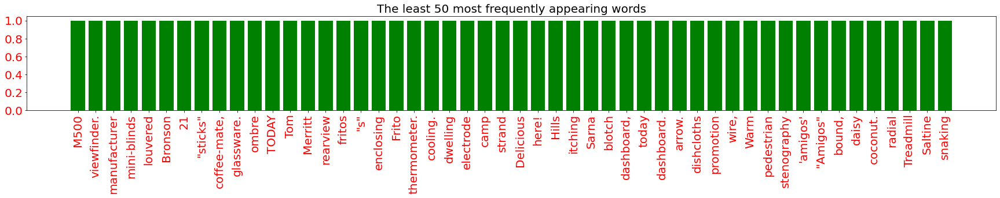

In [22]:
topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(30,3))
    plt.bar(dfsub.index,dfsub["count"],color ='g')
    plt.yticks(fontsize=20,color ='r')
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20,color ='r')
    plt.title(title,fontsize=20)
    plt.show()

plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

### Captions Cleaning

In [23]:
# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)

In [24]:
# To remove single characters
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

In [25]:
# To remove numeric values
def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

In [26]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    text = text.lower()
    return(text)

In [27]:
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [28]:
data.head()

,caption,image
0,the back of yellow rectangular cardboard box ...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
1,yellow box of best yet brand butter with nutr...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
2,cream made up of milk is used for cooking,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
3,yellow package of salted butter with the nutr...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...
4,yellow box of butter sits near the edge of wo...,E:\WorkSpace\Coding\Jupyter_workspace\TMP/data...


### Adding 'Start' and 'End' Tags

In [29]:
def preprocess_captions(data):
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions

In [30]:
total_captions = preprocess_captions(data)
total_captions[:10]

['<start>  the back of yellow rectangular cardboard box for best yet brand butter with nutrition facts and bar <end>',
 '<start>  yellow box of best yet brand butter with nutrition facts on the <end>',
 '<start>  cream made up of milk is used for cooking <end>',
 '<start>  yellow package of salted butter with the nutrition <end>',
 '<start>  yellow box of butter sits near the edge of wooden table where people are standing <end>',
 '<start>  an empty can of coke zero that is cherry <end>',
 '<start>  an empty bottle of zero sits on white <end>',
 '<start>  an empty bottle of cherry coke sitting on white counter <end>',
 '<start>  coca cola bottle sitting on white speckled <end>',
 '<start>  the corner of beavis and butthead <end>']

In [31]:
all_img_name_vector = list(data["image"])

In [32]:
print("Total Images : " + str(len(all_img_name_vector)))
print("Total Captions : " + str(len(total_captions)))

Total Images : 26784
Total Captions : 26784


In [33]:
train_captions = total_captions
img_name_vector = all_img_name_vector

In [34]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 26784 , Total images = 26784


In [35]:
# save to file
dump(train_captions, open('captions.pkl', 'wb'))
dump(img_name_vector, open('img_names.pkl', 'wb'))

In [36]:
# load
train_captions = load(open('captions.pkl', 'rb'))
img_name_vector = load(open('img_names.pkl', 'rb'))

### Check Size of Image

In [37]:
def img_shape_finder(image):
  img= plt.imread(image)

  print("Shape of the image ==> {0} is ==> {1}".format(image.split('/')[1],img.shape))

In [38]:
img_list=[]
for i in range(20):
  img_list.append(img_name_vector[i])

In [39]:
# To know the shape of images
def image_and_shapes(image):
  img= plt.imread(image)
  plt.imshow(img)
  print("Shape of the image:{}".format(img.shape))

Shape of the image:(1632, 1224, 3)


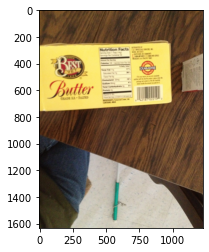

In [40]:
image_and_shapes(data["image"][0])

### Image Augmentation

In [41]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

In [42]:
# image_flipper(data["image"][0])

### Resize Image to (299, 299, 3)

In [43]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (299, 299, 3)


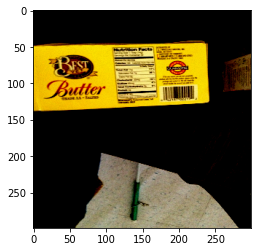

In [44]:
img1,img1_path = load_image(data['image'][0])
print("Shape after resize :", img1.shape)
plt.imshow(img1)

### Create InceptionV3 Model and Extract Features



*   Load Pretrained Imagenet Weights
*   
Use last convolutional layer in the InceptionV3 Architecture

In [45]:
image_model = InceptionV3(include_top=False,weights='imagenet')
new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

feature_extraction_model = tf.keras.Model(new_input, hidden_layer)

In [46]:
# feature_extraction_model.summary()

### Extracting Features

In [47]:
# Unique images
encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
# Map each image name to the function to load the image
image_dataset = image_dataset.map(load_image, 
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

In [48]:
for img, path in tqdm(image_dataset):
  batch_features = feature_extraction_model(img)
  batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

100%|████████████████████████████████████████████████████████████████████████████████| 375/375 [01:13<00:00,  5.07it/s]


# Data Preparation for RNN Decoder

### Tokenize Training Captions and Create Training Vocabulary

We will perform a few basic pre-processing steps on the captions such as:
First, we will tokenize the captions. This will help us to build a vocabulary of all the unique words in the data.
Next, we will limit the vocabulary size to top 5000 words to save memory. We will replace all the other words with the token < unk > (for words not in vocabulary).
Finally, we will create a word->index mapping and vice versa.
We will pad all sequences to be the same length as the longest one

In [49]:
def tokenize_caption(top_k,train_captions):
  # Choose the top words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'


  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

In [50]:
train_seqs , tokenizer = tokenize_caption(TOP_K_WORDS, train_captions)

In [51]:
train_captions[:3]

['<start>  the back of yellow rectangular cardboard box for best yet brand butter with nutrition facts and bar <end>',
 '<start>  yellow box of best yet brand butter with nutrition facts on the <end>',
 '<start>  cream made up of milk is used for cooking <end>']

In [52]:
train_seqs[:3] # Here we can see that the sentences are converted to sequences

[[2,
  6,
  45,
  4,
  43,
  378,
  251,
  18,
  30,
  1015,
  1941,
  63,
  314,
  7,
  124,
  176,
  8,
  231,
  3],
 [2, 43, 18, 4, 1015, 1941, 63, 314, 7, 124, 176, 5, 6, 3],
 [2, 155, 205, 32, 4, 237, 9, 202, 30, 286, 3]]

In [53]:
# oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
tokenizer.oov_token

'<unk>'

In [54]:
#tokenizer.index_word

In [55]:
#tokenizer.word_counts

### MaxLength and MinLength of Captions

In [56]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

In [57]:
# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)

### Padding of Vectors

In [58]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type, maxlen=max_length)
  return cap_vector

In [59]:
padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post')
print(padded_caption_vector.shape)

(26784, 53)


In [60]:
padded_caption_vector

array([[   2,    6,   45, ...,    0,    0,    0],
       [   2,   43,   18, ...,    0,    0,    0],
       [   2,  155,  205, ...,    0,    0,    0],
       ...,
       [   2,  384,    1, ...,    0,    0,    0],
       [   2,  109, 1119, ...,    0,    0,    0],
       [   2,   71,   92, ...,    0,    0,    0]])

# 7. Train-Test Split

In [61]:
# Create training and test set using an 80-20 split
img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,padded_caption_vector,test_size=0.2,random_state=0)

In [62]:
print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("Test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 21427,Y = 21427
Test Data : X = 5357,Y = 5357


# 8. Creating dataset for model

In [63]:
def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [64]:
def create_dataset(img_name_train, caption_train):

  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(
            load_npy, [item1, item2], [tf.float32, tf.int32]),
            num_parallel_calls=tf.data.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
  return dataset

In [65]:
# Creating train and test dataset
train_dataset = create_dataset(img_name_train, caption_train)
test_dataset = create_dataset(img_name_test, caption_test)

In [66]:
vocab_size = len(tokenizer.word_index) + 1 
num_steps = len(img_name_train) // BATCH_SIZE  
# So, say there are 49 pixel locations now and each pixel is 2048 dimensional
features_shape = 2048
attention_features_shape = 64 

# 9. Encoders and Decoders

In [67]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [68]:
class CNN_Encoder(tf.keras.Model):
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [69]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and 
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [70]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    # Embedding
    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)

    # Gated Recurrent Unit
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [71]:
encoder = CNN_Encoder(EMBEDDING_DIM)
# decoder = RNN_Decoder(EMBEDDING_DIM, UNITS, vocab_size)
decoder = Rnn_Local_Decoder(EMBEDDING_DIM, UNITS, vocab_size)

In [72]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')


def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

# Checkpoint

In [73]:
checkpoint_path_ckpt = "./checkpoint/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

In [74]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

# Tensorboard Setup

In [75]:
# Clear previous logs
!rm -rf ./logs/ 

'rm' 不是内部或外部命令，也不是可运行的程序
或批处理文件。


In [76]:
# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

In [77]:
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [78]:
loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  #train_loss(loss)
  #train_accuracy(target, predictions)

  return loss, total_loss

In [79]:
test_loss_plot = []

@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder

      
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*target.shape[0], 1)
 

  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

# Training

In [80]:
for epoch in range(start_epoch, EPOCHS):
    start = time.time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train/ num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    
    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 2 TrainLoss 1.008489 TestLoss 0.321313
Time taken for 1 epoch 247.94943952560425 sec

Epoch 3 TrainLoss 0.837590 TestLoss 0.327443
Time taken for 1 epoch 151.44903898239136 sec

Epoch 4 TrainLoss 0.766461 TestLoss 0.327502
Time taken for 1 epoch 155.43324089050293 sec

Epoch 5 TrainLoss 0.714230 TestLoss 0.328192
Time taken for 1 epoch 156.3826138973236 sec

Epoch 6 TrainLoss 0.670016 TestLoss 0.323155
Time taken for 1 epoch 158.1979296207428 sec

Epoch 7 TrainLoss 0.630016 TestLoss 0.333739
Time taken for 1 epoch 156.73563241958618 sec

Epoch 8 TrainLoss 0.593871 TestLoss 0.347424
Time taken for 1 epoch 158.79379105567932 sec

Epoch 9 TrainLoss 0.560098 TestLoss 0.352517
Time taken for 1 epoch 156.64277267456055 sec

Epoch 10 TrainLoss 0.528405 TestLoss 0.361534
Time taken for 1 epoch 156.3516755104065 sec



In [81]:
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

Reusing TensorBoard on port 6006 (pid 19408), started 5:53:47 ago. (Use '!kill 19408' to kill it.)

In [82]:
ckpt_manager.checkpoints

['./checkpoint/train\\ckpt-2',
 './checkpoint/train\\ckpt-3',
 './checkpoint/train\\ckpt-4',
 './checkpoint/train\\ckpt-1']

No handles with labels found to put in legend.


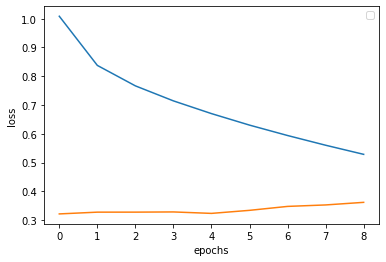

In [83]:
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

# Evaluate Captions

## Greedy Approach

In [97]:
def evaluateGreedy(image):
  # max_length:max caption length
  # attention_features_shape: image size (in effecientnet it's 7*7)
  attention_plot = np.zeros((max_length, attention_features_shape))

  # return tf.zeros((batch_size, self.units))
  hidden = decoder.reset_state(batch_size=1)


  # extend one dimension to match (batch,height,width,channel)
  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = feature_extraction_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],-1,img_tensor_val.shape[3]))

  features = encoder(img_tensor_val)


  dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
  result = []

  for i in range(max_length):
      predictions, hidden, attention_weights = decoder(dec_input,features,hidden)
      attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

      predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()

      # predicted_word = tf.compat.as_text(index_to_word(predicted_id).numpy())
      predicted_word = tokenizer.index_word[predicted_id]

      result.append(predicted_word)

      if predicted_word == '<end>':
          return result, attention_plot

      dec_input = tf.expand_dims([predicted_id], 0)

  attention_plot = attention_plot[:len(result), :]
  return result, attention_plot


In [140]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(30, 30))

    len_result = len(result)
    for i in range(len_result-1):
        temp_att = np.resize(attention_plot[i], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

## See the attention mechanism effect!

Real Captions:
 of woman wearing tank top with
 woman in green shirt is in the bathroom
 person in green shirt with writing on it and sink in the
 person with green shirt inscribed with text while they stand in what looks like the
Prediction Caption: arm clad in red cloth with purple jersey that has some variety of <end>


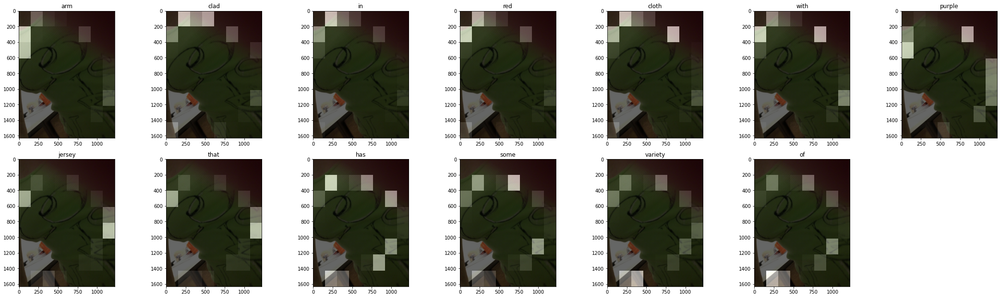

In [141]:
# test captions weight
# rid = np.random.randint(0, len(img_name_val))
# image = img_name_train[rid]
# tokenizer.index_word[193]

rid=300

# real_caption=' '.join([tokenizer.index_word[idx] for idx in caption_train[rid] if idx!=0])

tmp_lst=image_path_to_caption[img_name_train[rid]]
reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
 
# print(reference)
result, attention_plot = evaluateGreedy(img_name_train[rid])
predict_caption=' '.join(result)

print('Real Captions:')
for ref in reference:
  print(ref)
print('Prediction Caption:', ' '.join(result))

plot_attention(img_name_train[rid], result, attention_plot)

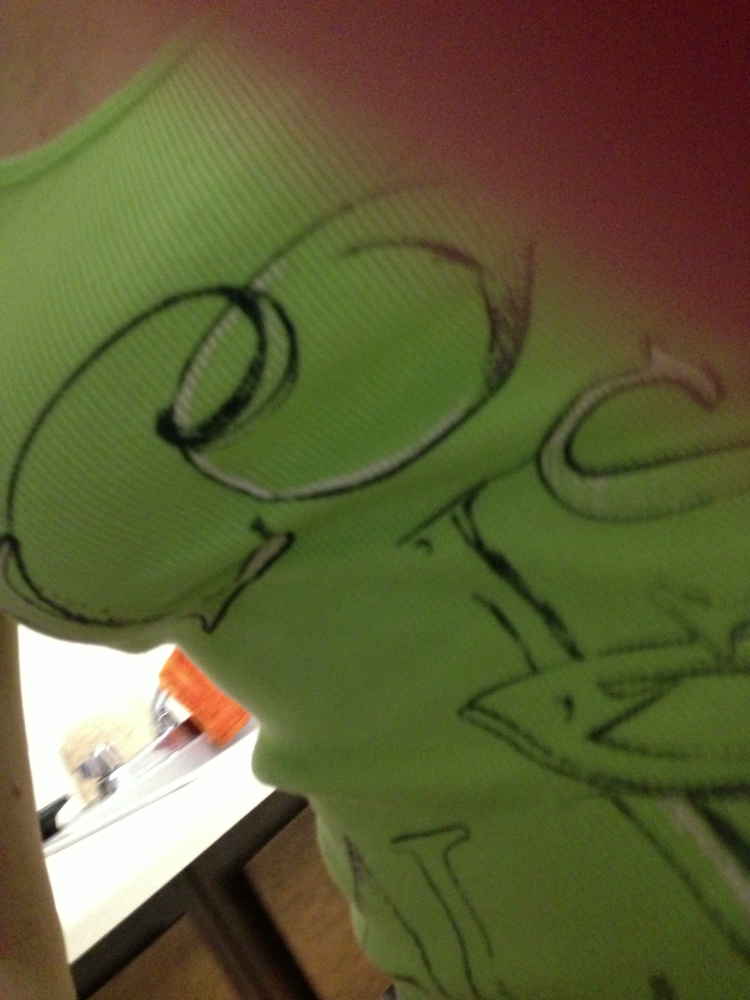

In [101]:
Image.open(img_name_train[rid])

Real Captions:
 violet carpet on the white floor with the pattern of lines in black on
 pictured is purple rug near couch on grey carpet or
 the looking past the edge of purple patterned over to the base of an unknown piece of
 some sort of purple rug that is very white and stuff
Prediction Caption: green colored piece of cloth object laying on blue <end>


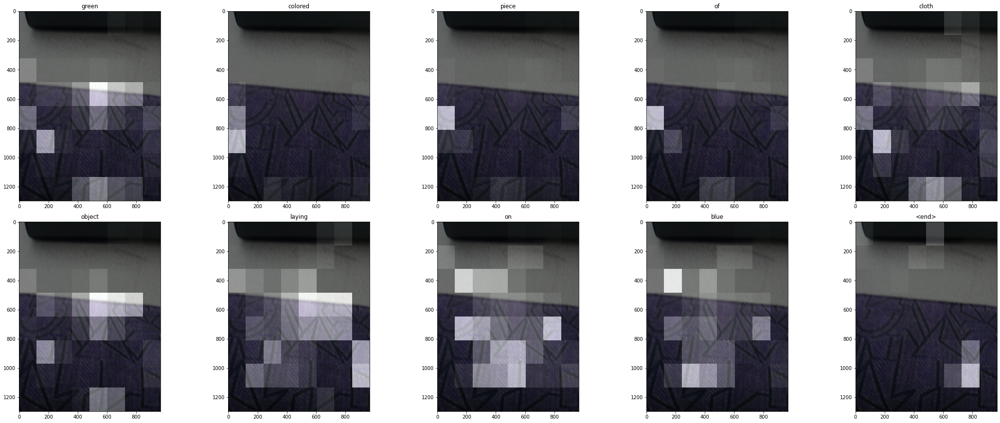

In [109]:
# test captions weight
# rid = np.random.randint(0, len(img_name_val))
# image = img_name_train[rid]
# tokenizer.index_word[193]

rid=300

# real_caption=' '.join([tokenizer.index_word[idx] for idx in caption_train[rid] if idx!=0])

tmp_lst=image_path_to_caption[img_name_test[rid]]
reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
 
# print(reference)
result, attention_plot = evaluateGreedy(img_name_test[rid])
predict_caption=' '.join(result)

print('Real Captions:')
for ref in reference:
  print(ref)
print('Prediction Caption:', ' '.join(result))

plot_attention(img_name_test[rid], result, attention_plot)

## BLEU Score

### Train set

In [89]:
from nltk.translate.bleu_score import sentence_bleu

In [90]:
bleu_1_sum,bleu_2_sum,bleu_3_sum,bleu_4_sum=0,0,0,0
# train-set bleu score
for image_name in img_name_train:
  tmp_lst=image_path_to_caption[image_name]
  reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
  result, attention_plot = evaluateGreedy(image_name)
  hypothesis=' '.join(result)
  bleu_1=100*sentence_bleu(reference, hypothesis, weights=(1, 0, 0, 0))
  bleu_2=100*sentence_bleu(reference, hypothesis, weights=(0, 1, 0, 0))
  bleu_3=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 1, 0))
  bleu_4=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 0, 1))
  bleu_1_sum+=bleu_1
  bleu_2_sum+=bleu_2
  bleu_3_sum+=bleu_3
  bleu_4_sum+=bleu_4
print("The BLEU score in the train data is:")
print("BLEU-1:",bleu_1_sum/len(img_name_train))
print("BLEU-2:",bleu_2_sum/len(img_name_train))
print("BLEU-3:",bleu_3_sum/len(img_name_train))
print("BLEU-4:",bleu_4_sum/len(img_name_train))

d:\software\python3.9.5\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
d:\software\python3.9.5\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
d:\software\python3.9.5\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.

The BLEU score in the train data is:
BLEU-1: 79.2087680833105
BLEU-2: 57.69364359339526
BLEU-3: 36.48394746703605
BLEU-4: 26.937973753503613


### Test set

In [91]:
bleu_1_sum,bleu_2_sum,bleu_3_sum,bleu_4_sum=0,0,0,0
# test-set bleu score
for image_name in img_name_test:
  tmp_lst=image_path_to_caption[image_name]
  reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
  result, attention_plot = evaluateGreedy(image_name)
  hypothesis=' '.join(result)
  bleu_1=100*sentence_bleu(reference, hypothesis, weights=(1, 0, 0, 0))
  bleu_2=100*sentence_bleu(reference, hypothesis, weights=(0, 1, 0, 0))
  bleu_3=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 1, 0))
  bleu_4=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 0, 1))
  bleu_1_sum+=bleu_1
  bleu_2_sum+=bleu_2
  bleu_3_sum+=bleu_3
  bleu_4_sum+=bleu_4
print("The BLEU score in the test data is:")
print("BLEU-1:",bleu_1_sum/len(img_name_test))
print("BLEU-2:",bleu_2_sum/len(img_name_test))
print("BLEU-3:",bleu_3_sum/len(img_name_test))
print("BLEU-4:",bleu_4_sum/len(img_name_test))

The BLEU score in the test data is:
BLEU-1: 78.86194383071485
BLEU-2: 56.430755341097814
BLEU-3: 34.73227770705621
BLEU-4: 25.157410758848204


# Beam Search

In [149]:
def evaluateBS(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = feature_extraction_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = final_caption[1:]
    return final_caption, attention_plot

Real Captions:
 imagine how you would describe this image on the phone to
 an upside down tray of frozen food with the cooking
 frozen food meal that is turned upside down showing the cooking directions for oven and microwave and
 cooking instructions printed on the bottom of package of
 type of food packaging with instructions on how to cook the
Prediction Caption: an open metal package of frozen food with the ingredients facing <end>


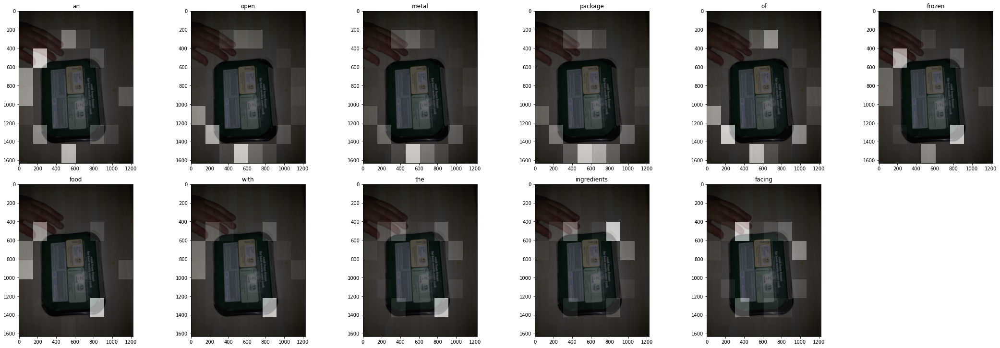

In [152]:
rid = np.random.randint(0, len(img_name_test))

# real_caption=' '.join([tokenizer.index_word[idx] for idx in caption_train[rid] if idx!=0])

tmp_lst=image_path_to_caption[img_name_test[rid]]
reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
 
# print(reference)
result, attention_plot = evaluateGreedy(img_name_test[rid])
predict_caption=' '.join(result)

print('Real Captions:')
for ref in reference:
  print(ref)
print('Prediction Caption:', ' '.join(result))

plot_attention(img_name_test[rid], result, attention_plot)

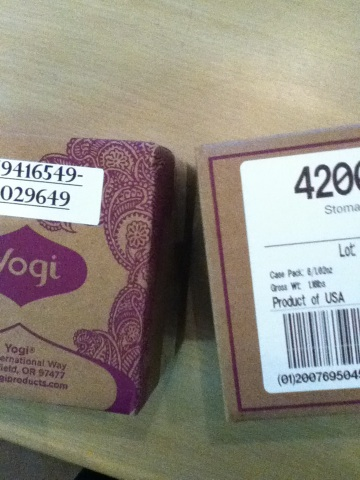

In [153]:
Image.open(img_name_train[rid])

### Test set

In [154]:
bleu_1_sum,bleu_2_sum,bleu_3_sum,bleu_4_sum=0,0,0,0
# test-set bleu score
for image_name in img_name_test:
  tmp_lst=image_path_to_caption[image_name]
  reference=[" ".join(text_clean(lst).split(' ')) for lst in tmp_lst]
  result, attention_plot = evaluateBS(image_name)
  hypothesis=' '.join(result)
  bleu_1=100*sentence_bleu(reference, hypothesis, weights=(1, 0, 0, 0))
  bleu_2=100*sentence_bleu(reference, hypothesis, weights=(0, 1, 0, 0))
  bleu_3=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 1, 0))
  bleu_4=100*sentence_bleu(reference, hypothesis, weights=(0, 0, 0, 1))
  bleu_1_sum+=bleu_1
  bleu_2_sum+=bleu_2
  bleu_3_sum+=bleu_3
  bleu_4_sum+=bleu_4
print("The BLEU score in the test data is:")
print("BLEU-1:",bleu_1_sum/len(img_name_test))
print("BLEU-2:",bleu_2_sum/len(img_name_test))
print("BLEU-3:",bleu_3_sum/len(img_name_test))
print("BLEU-4:",bleu_4_sum/len(img_name_test))

The BLEU score in the test data is:
BLEU-1: 50.32459188373175
BLEU-2: 39.90471212802229
BLEU-3: 30.150370325610627
BLEU-4: 24.282310781815703
